In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import image
import os
import sys
from skimage.io import imread
import matplotlib.pyplot as plt
import scipy.fftpack as fp
from scipy import fftpack 
from scipy import signal
from scipy import ndimage
import astropy.convolution

# Functions to obtain the frames and graph

In [2]:
def next_odd(x):
    """
    Find the next odd number.
    
    Parameters
    ----------
    x : int or float
        Number
        
    Returns
    -------    
    x : int
        Next odd number.
    """
    x = np.ceil(x)
    if x % 2 == 1:
        return x
    else:
        x += 1
        return x

In [3]:
def get_frames(dir_video, dir_frames):
    cap= cv2.VideoCapture(dir_video)
    i=0
    os.mkdir(dir_frames)
    while(cap.isOpened()):
        ret, frame = cap.read()
        if ret == False:
            break
        cv2.imwrite(dir_frames + 'kang'+str(i)+'.jpg',frame)
        i+=1
    cap.release()
    cv2.destroyAllWindows()
    
#get_frames('data/20khz.mp4', '20khz/')    

In [4]:
def contrast_plot(frame, x_min = -0.5, x_max = 0.5, bar_label = r'Contrast', save = 'off'):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111)
    p =plt.imshow(frame, cmap = 'viridis')
    #cbar = fig.colorbar(p, ax=ax)
    #plt.clim(x_min,x_max)
    #cbar.ax.get_yaxis().labelpad = 20
    #cbar.ax.set_ylabel(bar_label, rotation=-270, fontsize=20)
    #cbar.ax.tick_params(labelsize=18)
    plt.ylabel('y  [pixel]', fontsize = 20)
    plt.xlabel('x  [pixel]', fontsize = 20)
    plt.xticks(size = 18)
    plt.yticks(size = 18)
    
    if save != 'off':
        plt.savefig('images/' + save + '.pdf', dpi = 720)

def get_frame(dir_frame_n,x = 400, x_0=600, y = 750, y_0=600):
    img = image.imread(dir_frame_n)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img_gray[x:x+x_0,y:y+y_0]

## Get frames

In [78]:
frame_20 = get_frame('20khz/kang100.jpg')      
Z1 = 1
Z2 = 100
Z = Z2-Z1
X = frame_20.shape[0]
Y = frame_20.shape[1]
video = np.zeros((Z,X,Y))

for i in range(Z1,Z2):
    video[i-Z1,:,:] = get_frame('20khz/kang'+ str(i) +'.jpg')  

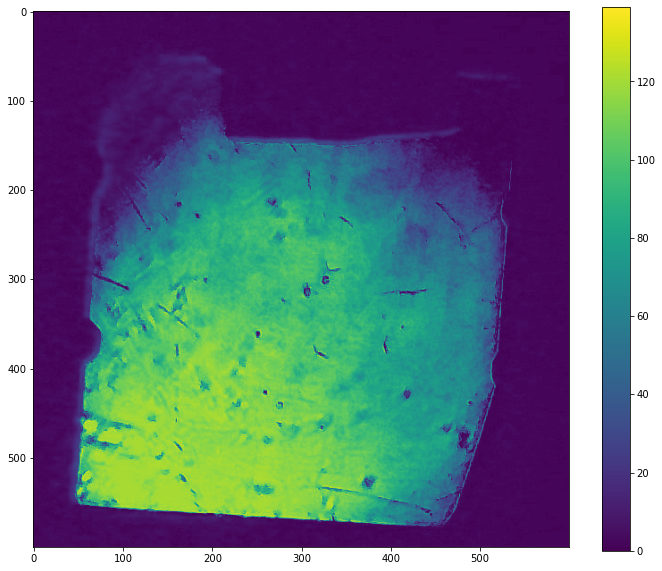

In [79]:
fig = plt.figure(figsize=(12, 10))
plt.imshow(video[10,:,:])
plt.colorbar()

### Fourier transform in the time dimension

In [80]:
video_fft_0 = np.fft.rfft(video, axis=0)

In [81]:
video_fft = video_fft_0.copy()

<ipython-input-99-e1e14cfc7201>:1: ComplexWarning: Casting complex values to real discards the imaginary part
  contrast_plot((20*np.log10( 0.1 + video_fft [10,:,:])).astype(int), save='20khz_fft_t')


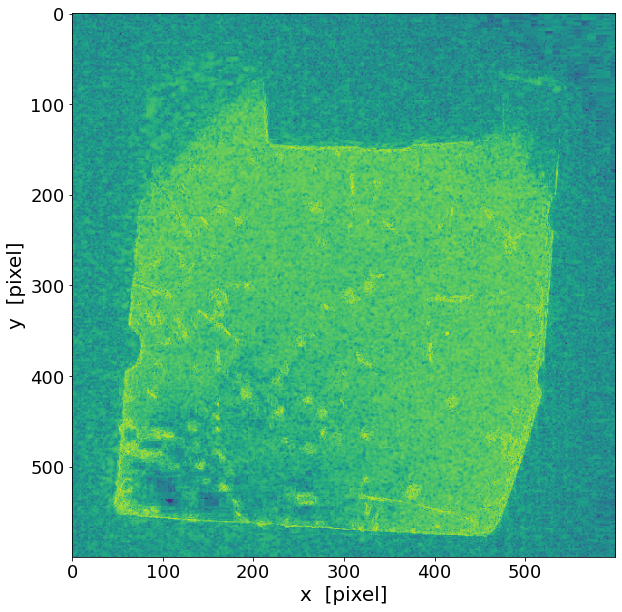

In [99]:
contrast_plot((20*np.log10( 0.1 + video_fft [10,:,:])).astype(int), save='20khz_fft_t')

<ipython-input-82-c65ab9f4a3d8>:2: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow((20*np.log10( 0.1 + video_fft [10,:,:])).astype(int))


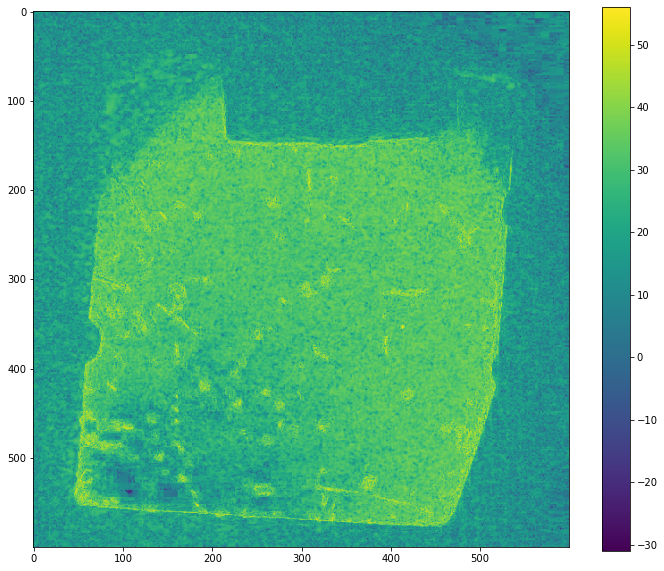

In [82]:
fig = plt.figure(figsize=(12, 10))
plt.imshow((20*np.log10( 0.1 + video_fft [10,:,:])).astype(int))
plt.colorbar()

In [181]:
#low-frequency filter in the time dimension
video_fft = video_fft_0.copy()
video_fft[0:25,:,:]=0

#video_fft[1:91,:,:] = 0

### Inverse Fourier Transform

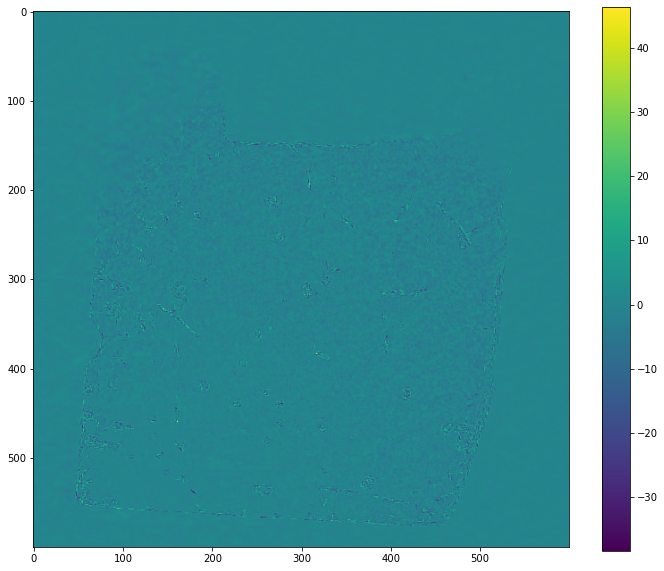

In [182]:
#Inverse Fourier Transform
vide_fil = np.fft.irfft(video_fft, axis=0)
fig = plt.figure(figsize=(12, 10))
plt.imshow(vide_fil[10,:,:])
plt.colorbar()

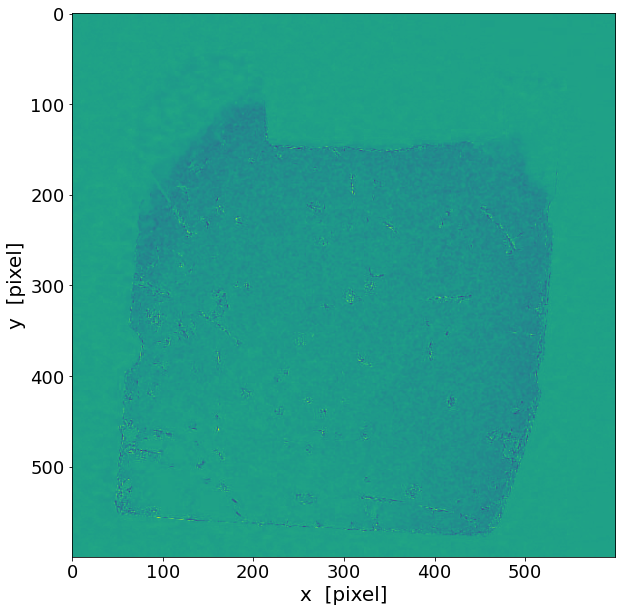

In [100]:
contrast_plot(vide_fil[10,:,:], save='20khz_fft_t_filt')

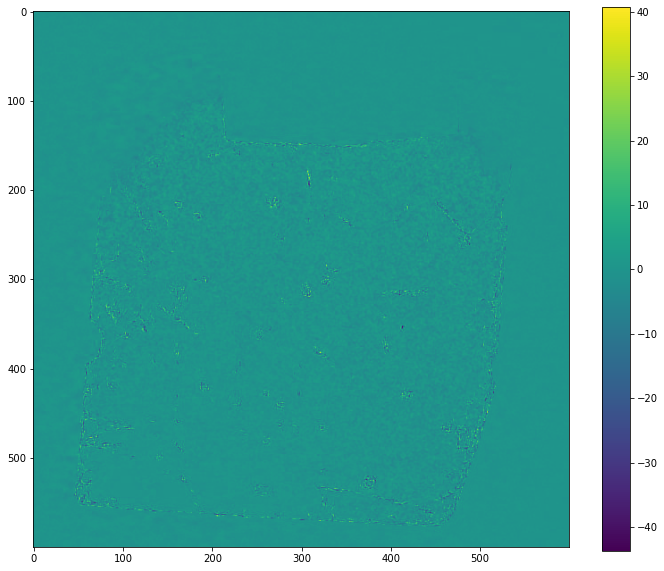

In [183]:
fig = plt.figure(figsize=(12, 10))
plt.imshow(vide_fil[12,:,:])
plt.colorbar()

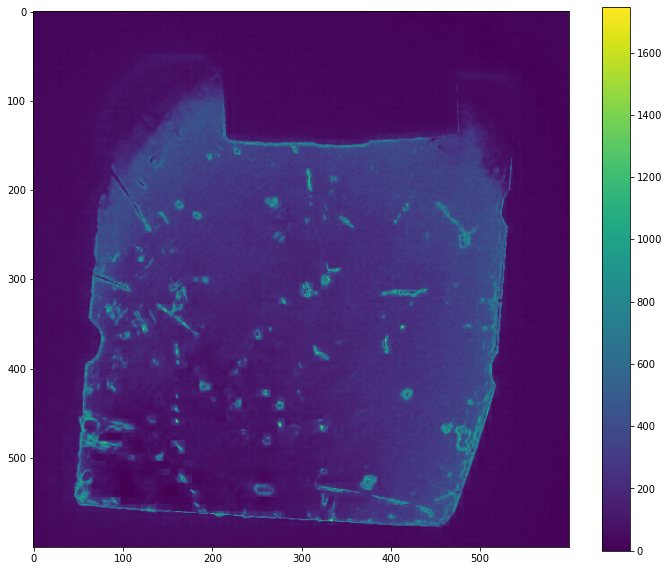

In [185]:
#Sum of the possible contributions of the standing waves in the frames
vide_sum_fil = abs(vide_fil).sum(axis=0) 
fig = plt.figure(figsize=(12, 10))
plt.imshow(vide_sum_fil)
plt.colorbar()

## The same procedure in the temporal dimension and for the spatial dimension A Gaussian filter is applied to (with null center) to try to remove low frequency noise (camera noise)

<ipython-input-186-a90ee13c3783>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow((20*np.log10( 0.1 + F2[10,:,:])).astype(int))


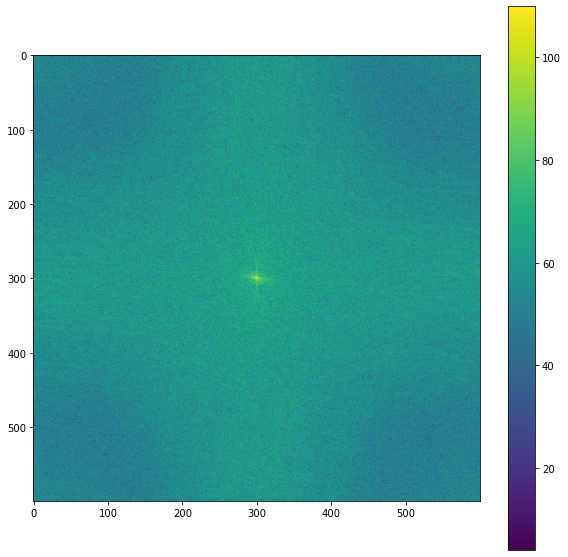

In [186]:
F1 = fftpack.fft2((vide_fil).astype(float))
F2 = fftpack.fftshift(F1)
plt.figure(figsize=(10,10))
plt.imshow((20*np.log10( 0.1 + F2[10,:,:])).astype(int))
plt.colorbar()
#contrast_plot((20*np.log10( 0.1 + F2)).astype(int))#, save='30khz_fft')

<ipython-input-101-ceba59926416>:1: ComplexWarning: Casting complex values to real discards the imaginary part
  contrast_plot((20*np.log10( 0.1 + F2[10,:,:])).astype(int), save='20khz_fft_t_filt_fft_s')


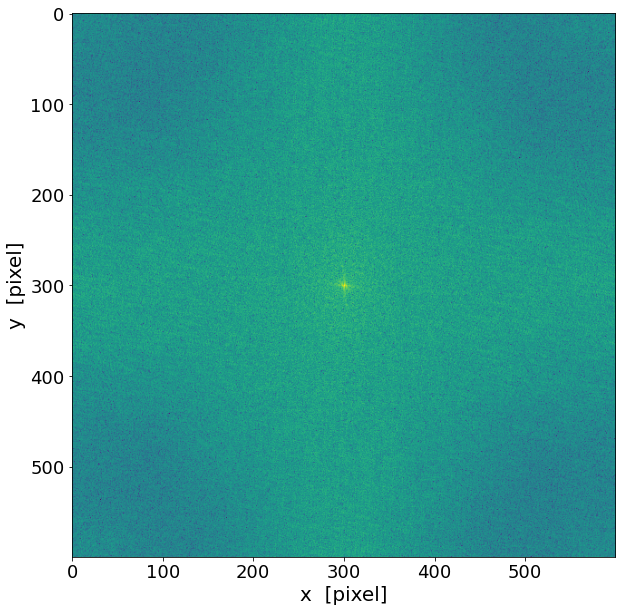

In [101]:
contrast_plot((20*np.log10( 0.1 + F2[10,:,:])).astype(int), save='20khz_fft_t_filt_fft_s')

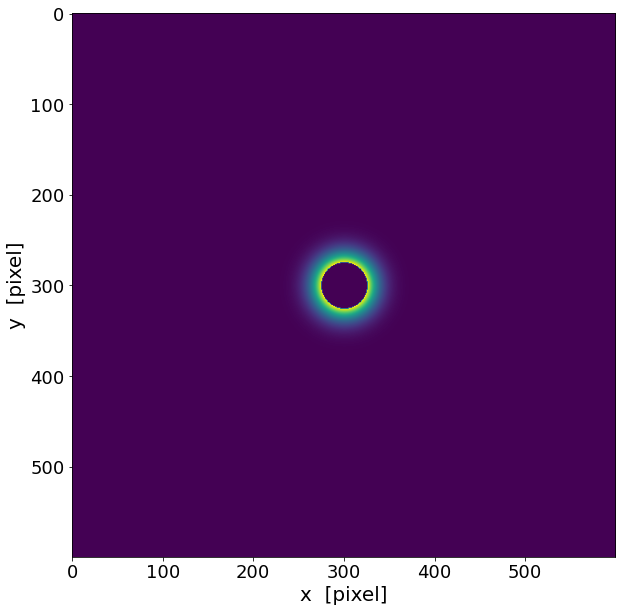

In [225]:
#Gaussian Kernel
size = 50
sigma = 20
psf = astropy.convolution.Gaussian2DKernel(sigma)
psf = np.array(psf)

(w, h) = psf.shape
half_w, half_h = int(w/2), int(h/2)

n = 25
for i in range(len(psf)):
    for j in range(len(psf[0])):
        if (i-half_w)**2+(j-half_h)**2 < 650:
                psf[i,j] = 0

#mask = psf < np.max(psf)/1.2
#psf[~mask] = 0
psf = psf / psf.sum()

c, a, b = F2.shape
    
fshape = a
center = fshape - (fshape+1) // 2
new_psf = np.zeros([fshape, fshape])
index = slice(center - psf.shape[0] // 2, center + (psf.shape[0] + 1) // 2)
new_psf[index, index] = psf

contrast_plot(new_psf)#, save='filt_gaussian_20_circ3')

<ipython-input-226-14d956d480c0>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  contrast_plot((20*np.log10( 0.1 + furier_m[10])).astype(int))#, save='30_fft_filt_gaussian_25_circ250')


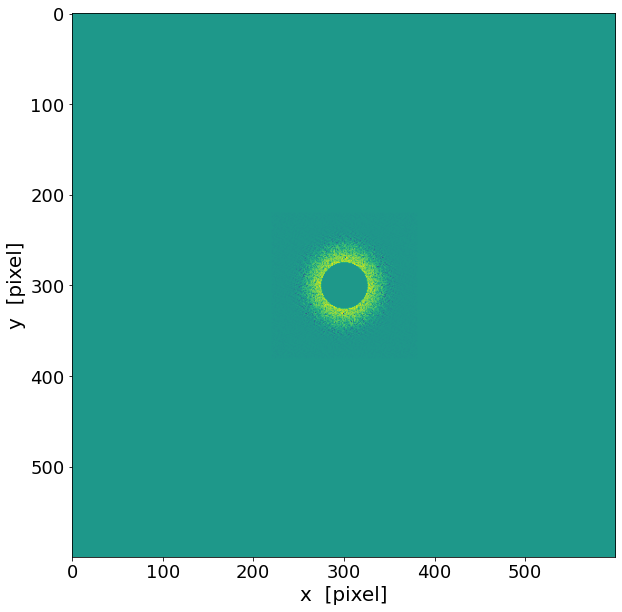

In [226]:
furier_m = new_psf*F2

#plt.imshow( (20*np.log10( 0.1 + furier_m)).astype(int), cmap=plt.cm.gray)
contrast_plot((20*np.log10( 0.1 + furier_m[10])).astype(int))#, save='30_fft_filt_gaussian_25_circ250')

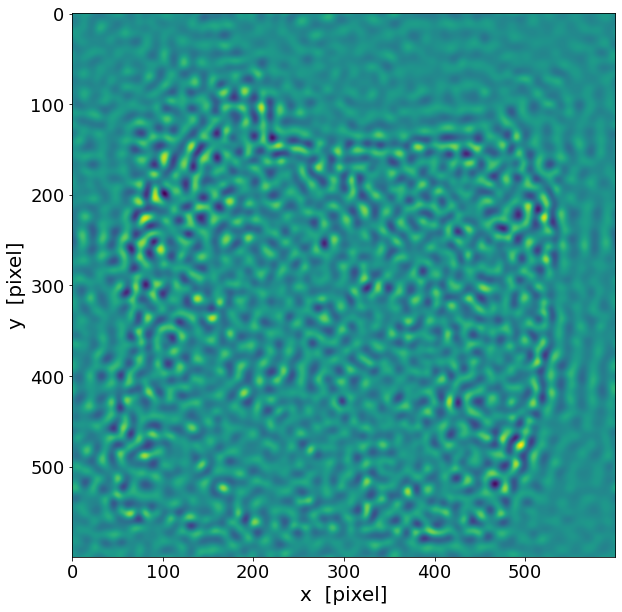

In [227]:
##Inverse Fourier Transform
im1 = fp.ifft2(fftpack.ifftshift(furier_m)).real
contrast_plot(im1[0])#, save='30khz_filt_gaussian_25_circ250')

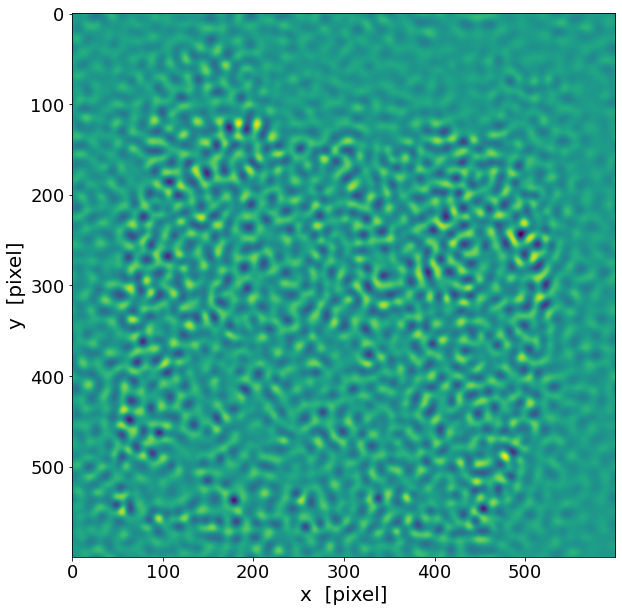

In [228]:
contrast_plot(im1[10])#, save='20khz_fft_t_filt_fft_s_filt_direct')

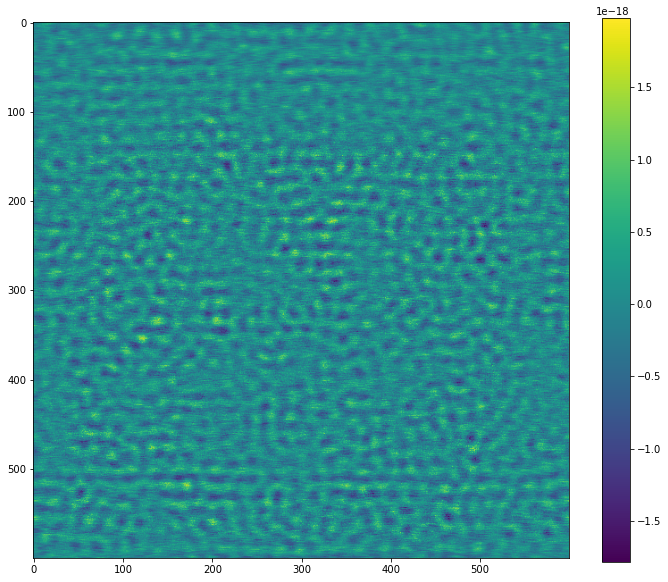

In [229]:
#sum of the contributions
im1_sum = (im1[:,:,:]).sum(axis=0,) 
fig = plt.figure(figsize=(12, 10))
plt.imshow(im1_sum)
plt.colorbar()

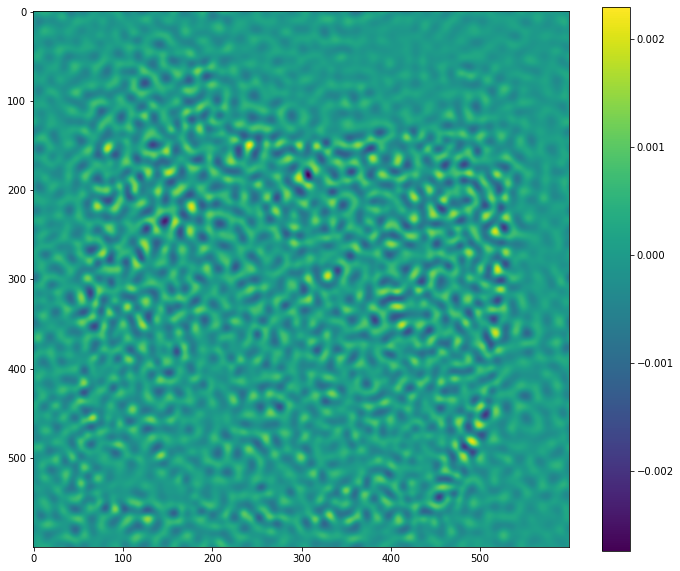

In [230]:
im1_sum2 = (im1[np.arange(1,97,7),:,:]).sum(axis=0,) 
fig = plt.figure(figsize=(12, 10))
plt.imshow(im1_sum2)
plt.colorbar()

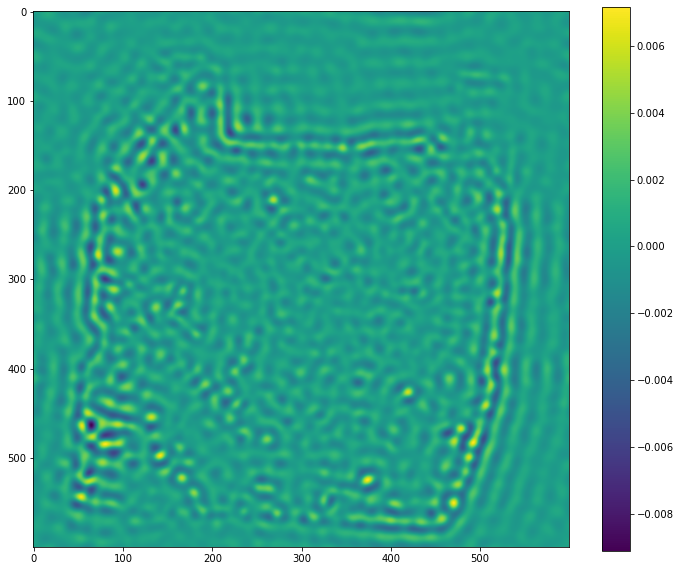

In [231]:
im1_sum1 = (im1[np.arange(0,98,2),:,:]).sum(axis=0,) 
fig = plt.figure(figsize=(12, 10))
plt.imshow(im1_sum1)
plt.colorbar()

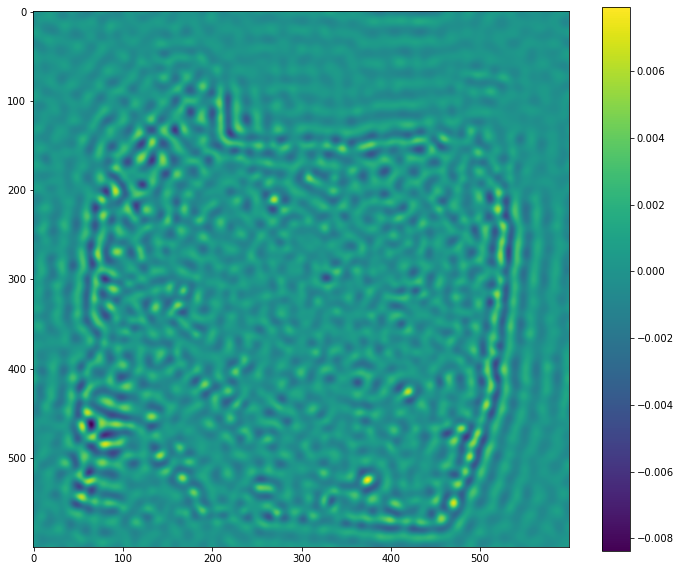

In [232]:
fig = plt.figure(figsize=(12, 10))
plt.imshow(im1_sum1-im1_sum2)
plt.colorbar()

## The same procedure for 25 Khz

In [56]:
frame_20 = get_frame('25khz/kang100.jpg')      
Z1 = 1
Z2 = 100
Z = Z2-Z1
X = frame_20.shape[0]
Y = frame_20.shape[1]
video = np.zeros((Z,X,Y))

for i in range(Z1,Z2):
    video[i-Z1,:,:] = get_frame('25khz/kang'+ str(i) +'.jpg')  

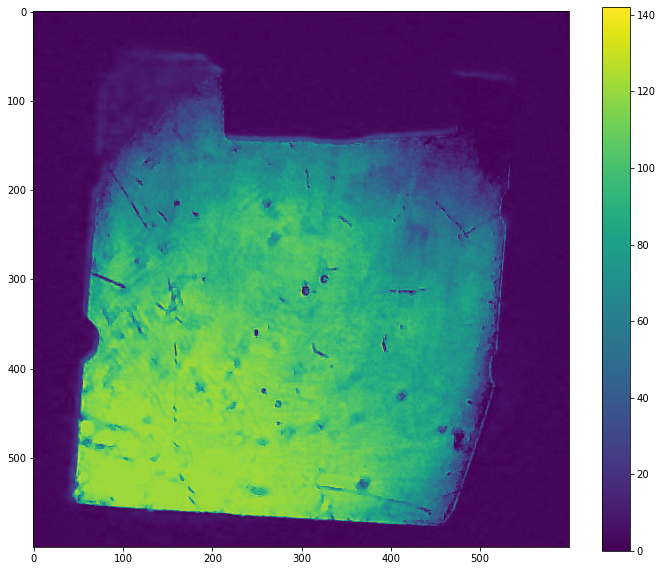

In [57]:
fig = plt.figure(figsize=(12, 10))
plt.imshow(video[10,:,:])
plt.colorbar()

In [58]:
video_fft_0 = np.fft.rfft(video, axis=0)


In [59]:
video_fft = video_fft_0.copy()

<ipython-input-60-c65ab9f4a3d8>:2: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow((20*np.log10( 0.1 + video_fft [10,:,:])).astype(int))


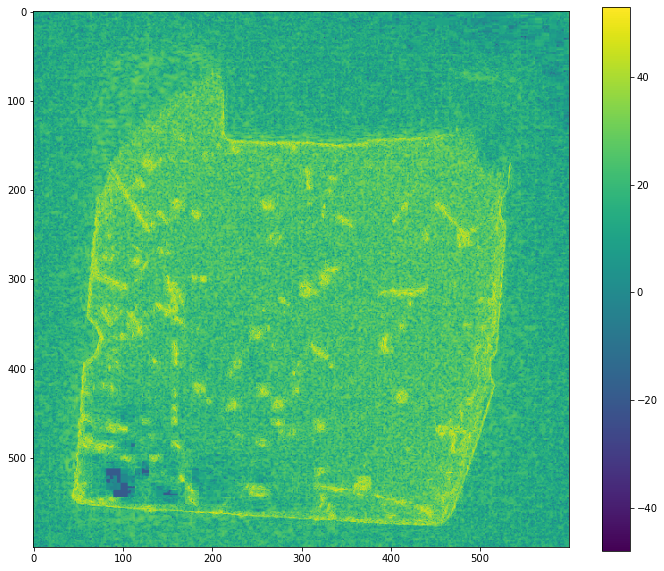

In [60]:
fig = plt.figure(figsize=(12, 10))
plt.imshow((20*np.log10( 0.1 + video_fft [10,:,:])).astype(int))
plt.colorbar()

In [61]:
video_fft[:,150,150].shape

(50,)

In [62]:
video_fft = video_fft_0.copy()
video_fft[0:10,:,:]=0

#video_fft[1:91,:,:] = 0

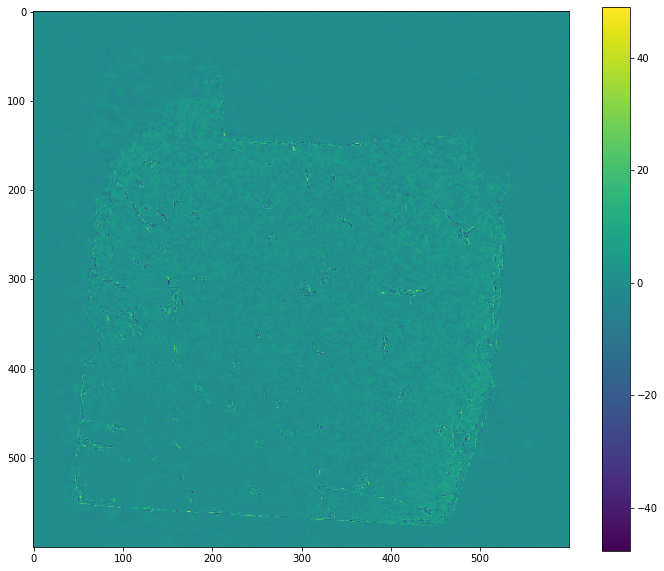

In [63]:
vide_fil = np.fft.irfft(video_fft, axis=0)
fig = plt.figure(figsize=(12, 10))
plt.imshow(vide_fil[10,:,:])
plt.colorbar()

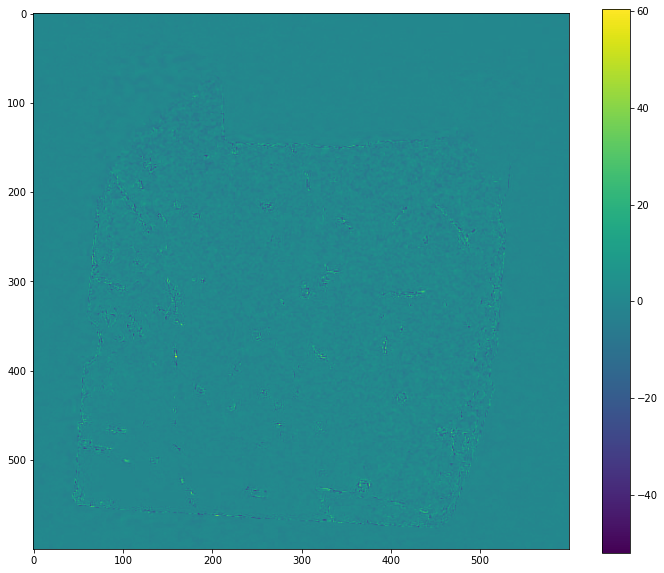

In [64]:
fig = plt.figure(figsize=(12, 10))
plt.imshow(vide_fil[12,:,:])
plt.colorbar()

In [65]:
vide_fil.shape

(98, 600, 600)

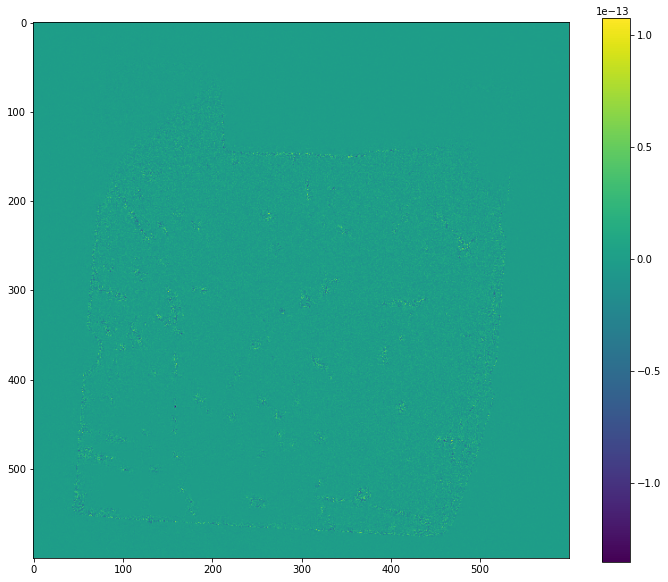

In [66]:
vide_sum_fil = vide_fil.sum(axis=0) 
fig = plt.figure(figsize=(12, 10))
plt.imshow(vide_sum_fil)
plt.colorbar()

<ipython-input-67-a90ee13c3783>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow((20*np.log10( 0.1 + F2[10,:,:])).astype(int))


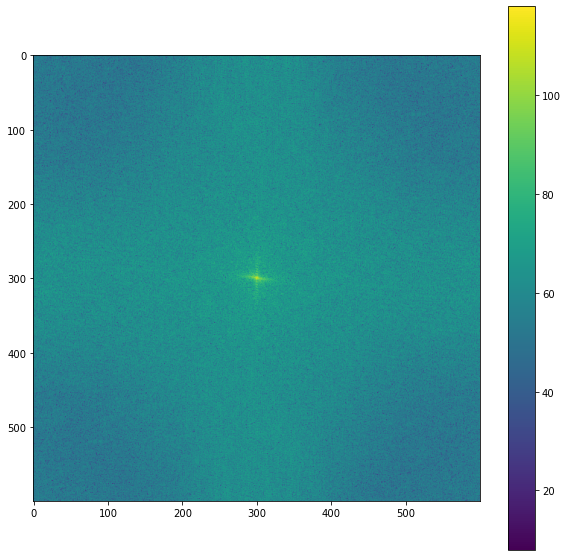

In [67]:
F1 = fftpack.fft2((vide_fil).astype(float))
F2 = fftpack.fftshift(F1)
plt.figure(figsize=(10,10))
plt.imshow((20*np.log10( 0.1 + F2[10,:,:])).astype(int))
plt.colorbar()
#contrast_plot((20*np.log10( 0.1 + F2)).astype(int))#, save='30khz_fft')

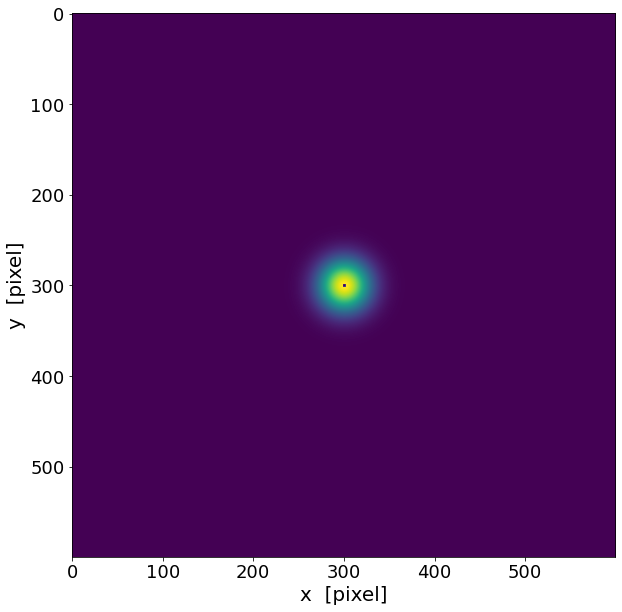

In [68]:
size = 50
sigma = 20
psf = astropy.convolution.Gaussian2DKernel(sigma)
psf = np.array(psf)

(w, h) = psf.shape
half_w, half_h = int(w/2), int(h/2)

n = 25
for i in range(len(F2)):
    for j in range(len(F2[0])):
        if (i-half_w)**2+(j-half_h)**2 < 3:
                psf[i,j] = 0

#mask = psf < np.max(psf)/1.2
#psf[~mask] = 0
psf = psf / psf.sum()

c, a, b = F2.shape
    
fshape = a
center = fshape - (fshape+1) // 2
new_psf = np.zeros([fshape, fshape])
index = slice(center - psf.shape[0] // 2, center + (psf.shape[0] + 1) // 2)
new_psf[index, index] = psf

contrast_plot(new_psf)#, save='filt_gaussian_25_circ250')

<ipython-input-69-14d956d480c0>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  contrast_plot((20*np.log10( 0.1 + furier_m[10])).astype(int))#, save='30_fft_filt_gaussian_25_circ250')


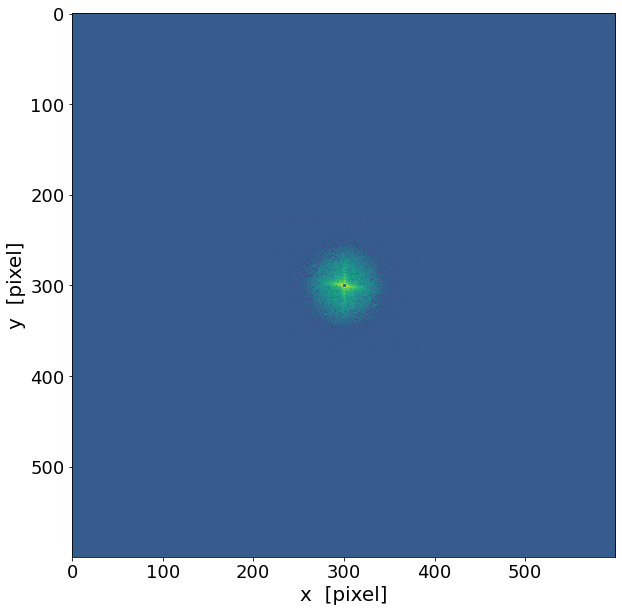

In [69]:
furier_m = new_psf*F2

#plt.imshow( (20*np.log10( 0.1 + furier_m)).astype(int), cmap=plt.cm.gray)
contrast_plot((20*np.log10( 0.1 + furier_m[10])).astype(int))#, save='30_fft_filt_gaussian_25_circ250')

In [70]:
furier_m.shape

(98, 600, 600)

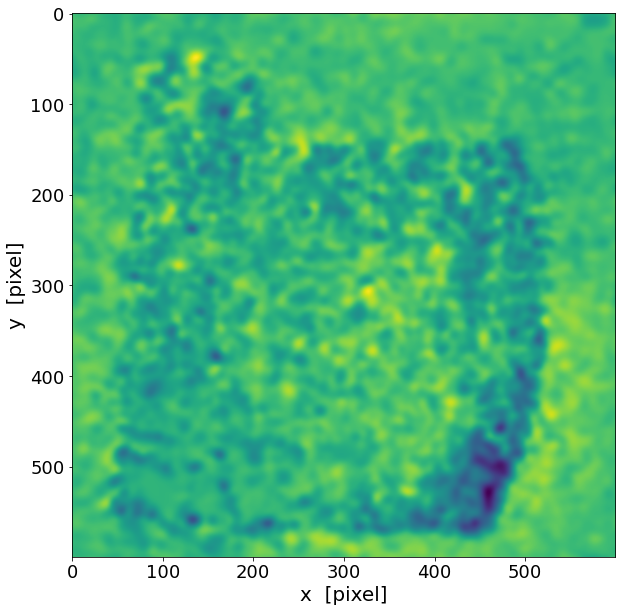

In [71]:
im1 = fp.ifft2(fftpack.ifftshift(furier_m)).real
contrast_plot(im1[0])#, save='30khz_filt_gaussian_25_circ250')

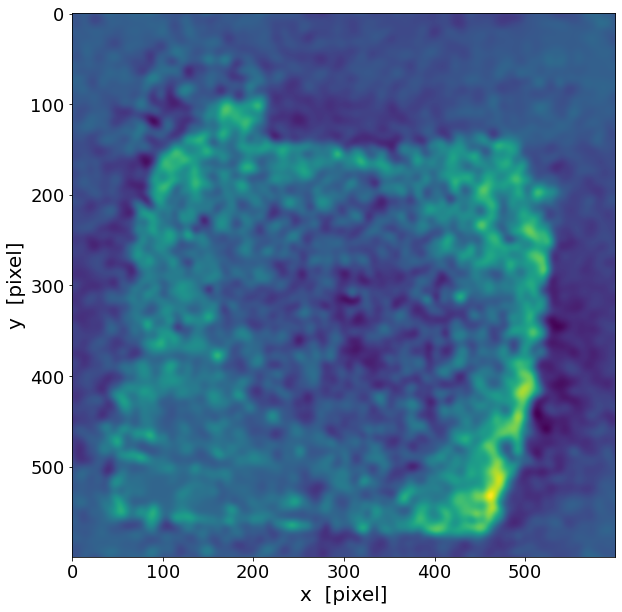

In [72]:
contrast_plot(im1[10])

In [73]:
im1.shape

(98, 600, 600)

In [74]:
np.arange(0,98,2)

array([ 0,  2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32,
       34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66,
       68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96])

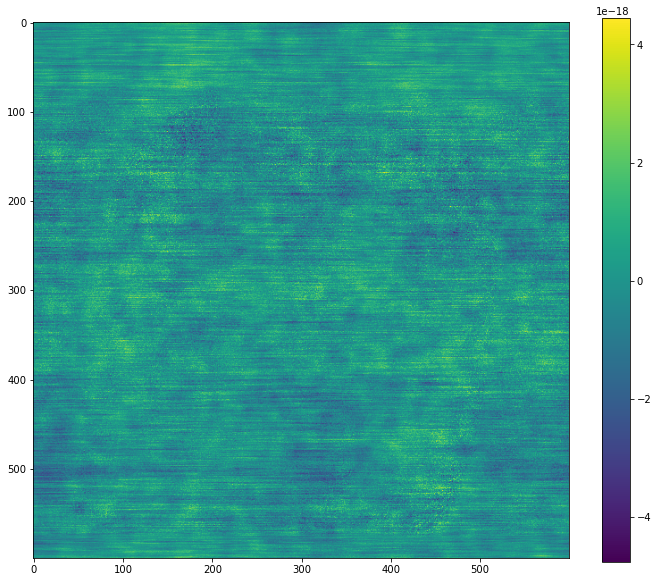

In [75]:
im1_sum = (im1[:,:,:]).sum(axis=0,) 
fig = plt.figure(figsize=(12, 10))
plt.imshow(im1_sum)
plt.colorbar()

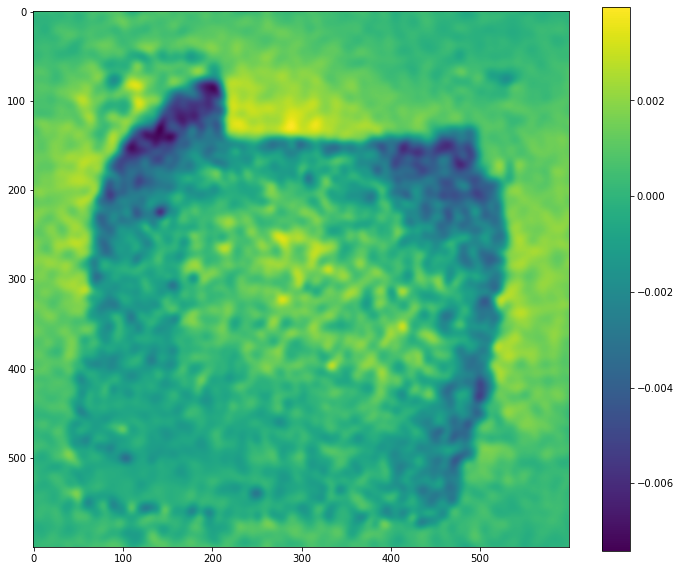

In [77]:
im1_sum = (im1[np.arange(0,98,2),:,:]).sum(axis=0,) 
fig = plt.figure(figsize=(12, 10))
plt.imshow(im1_sum)
plt.colorbar()

## Other filters

(11,)


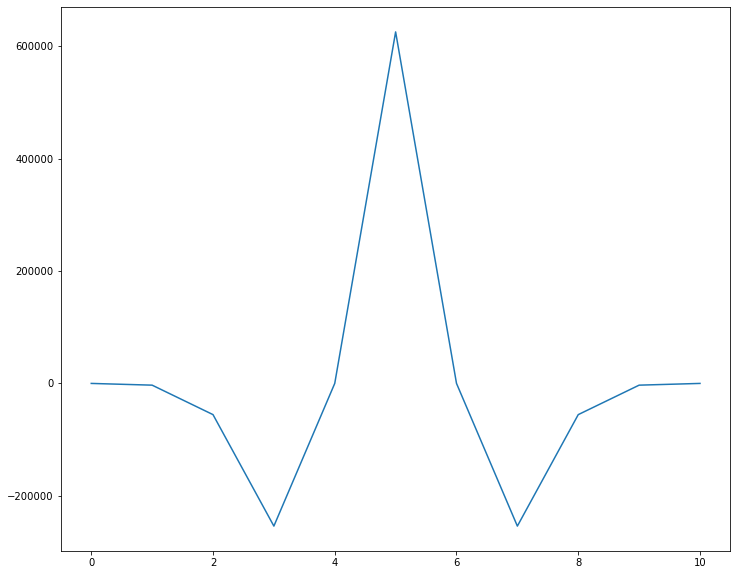

In [692]:
sigma = 1
lsf = astropy.convolution.RickerWavelet1DKernel(sigma, x_size = next_odd(10*sigma))
print(lsf.shape)
lsf = np.array(lsf)
lsf = lsf / lsf.sum()
fig = plt.figure(figsize=(12, 10))
plt.plot(np.arange(len(lsf)), lsf)

In [693]:
New_video = np.zeros((Z,X,Y))

for j in range(Y):
        for i in range(X):
            #New_video[:, i, j] = signal.sosfilt(sos, video[:, i, j])
            New_video[:, i, j] = astropy.convolution.convolve(video[:, i, j],lsf)


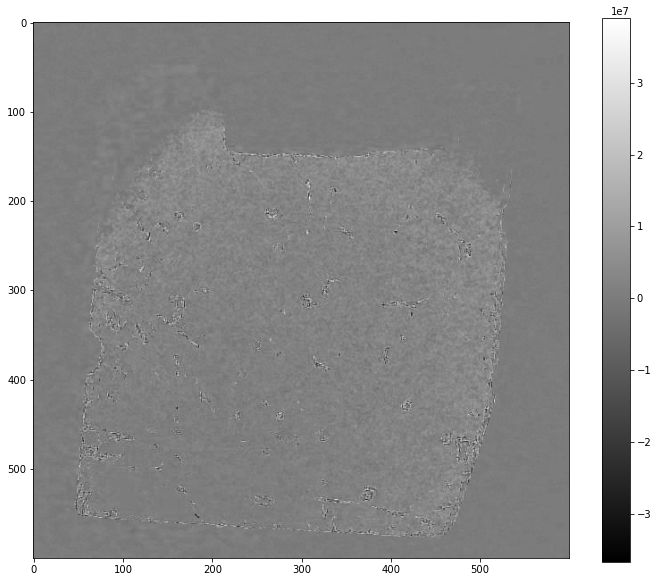

In [694]:
fig = plt.figure(figsize=(12, 10))
plt.imshow(New_video[10,:,:])
plt.colorbar()

<ipython-input-695-9f2614c4647e>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow((20*np.log10( 0.1 + F2)).astype(int))


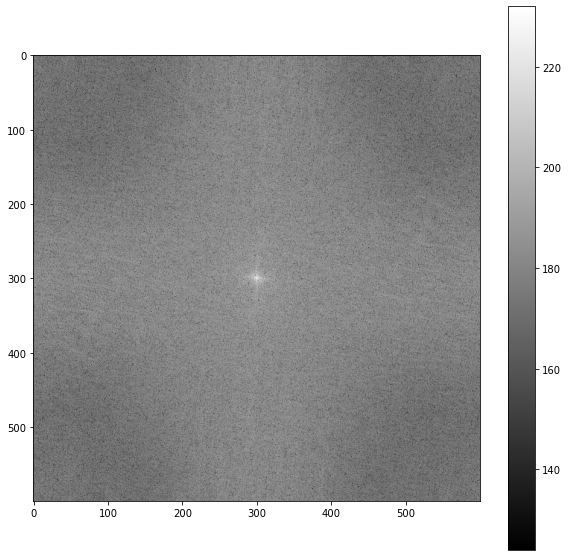

In [695]:
F1 = fftpack.fft2((New_video[10,:,:]).astype(float))
F2 = fftpack.fftshift(F1)
plt.figure(figsize=(10,10))
plt.imshow((20*np.log10( 0.1 + F2)).astype(int))
plt.colorbar()
#contrast_plot((20*np.log10( 0.1 + F2)).astype(int))#, save='30khz_fft')

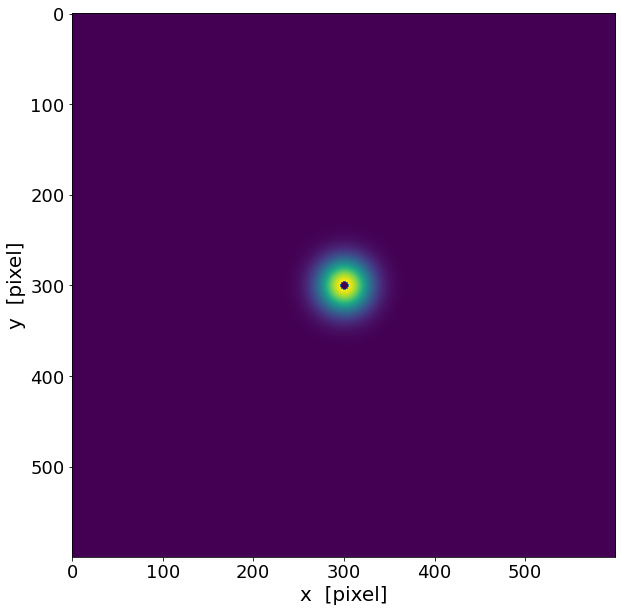

In [696]:
size = 50
sigma = 20
psf = astropy.convolution.Gaussian2DKernel(sigma)
psf = np.array(psf)

(w, h) = psf.shape
half_w, half_h = int(w/2), int(h/2)

n = 25
for i in range(len(F2)):
    for j in range(len(F2[0])):
        if (i-half_w)**2+(j-half_h)**2 < 20:
                psf[i,j] = 0

#mask = psf < np.max(psf)/1.2
#psf[~mask] = 0
psf = psf / psf.sum()

a, b = F2.shape
    
fshape = a
center = fshape - (fshape+1) // 2
new_psf = np.zeros([fshape, fshape])
index = slice(center - psf.shape[0] // 2, center + (psf.shape[0] + 1) // 2)
new_psf[index, index] = psf

contrast_plot(new_psf)#, save='filt_gaussian_25_circ250')

<ipython-input-697-298bdf81158c>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  contrast_plot((20*np.log10( 0.1 + furier_m)).astype(int))#, save='30_fft_filt_gaussian_25_circ250')


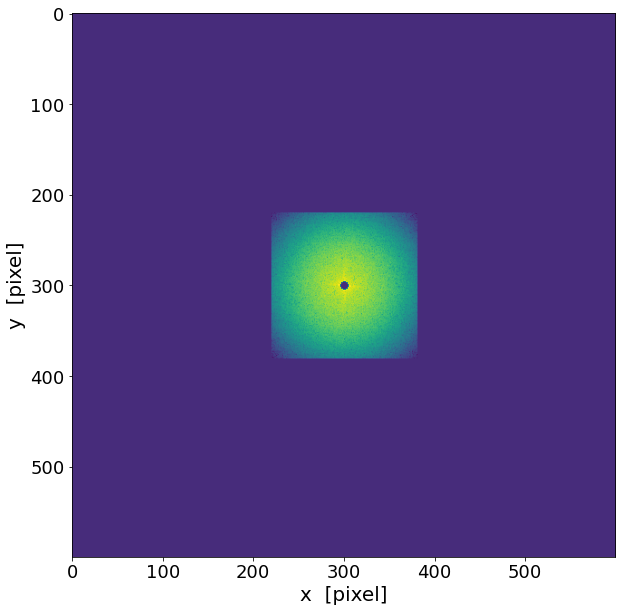

In [697]:
furier_m = new_psf*F2

#plt.imshow( (20*np.log10( 0.1 + furier_m)).astype(int), cmap=plt.cm.gray)
contrast_plot((20*np.log10( 0.1 + furier_m)).astype(int))#, save='30_fft_filt_gaussian_25_circ250')

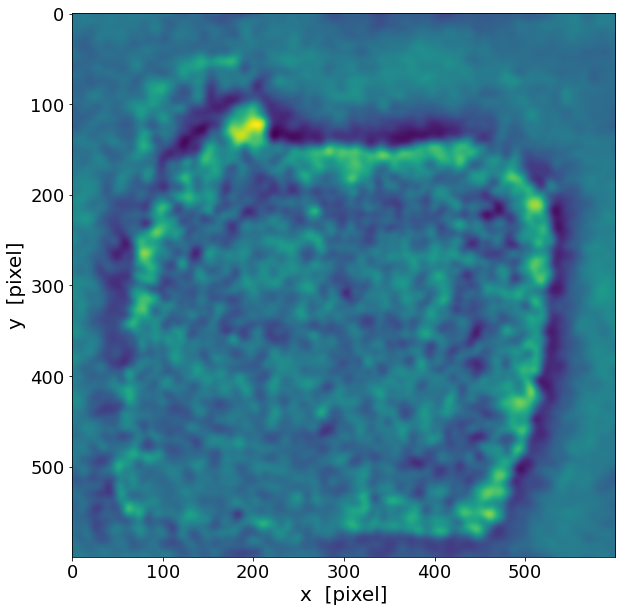

In [698]:
im1 = fp.ifft2(fftpack.ifftshift(furier_m)).real
contrast_plot(im1)#, save='30khz_filt_gaussian_25_circ250')